# Predicting Speed Dating Outcomes Insights

## Overview

In this notebook we conduct data analysis on speed dating data. Each date was for four minute dates and the twenty-two different waves took place during the years of 2002 and 2004. During each wave, containing differing numbers of participants, individuals filled out surveys before, during, and after each date.

Some of the primary points we investigate are demographic, career, and the relation between how people perceive themselves and others.

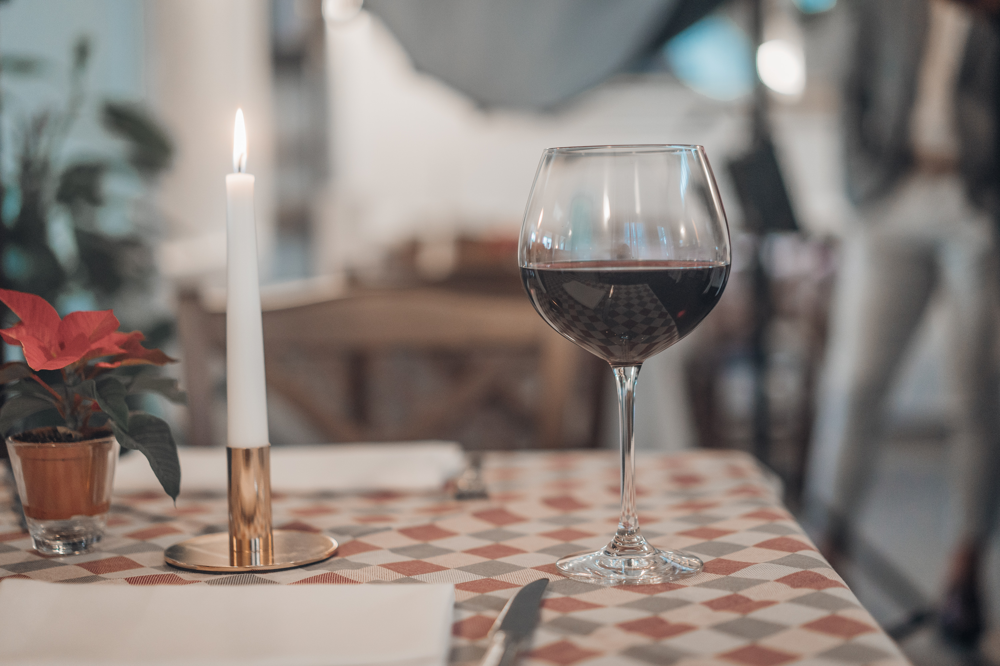

<center>
    Image by
    <a href = https://unsplash.com/@frame_media>René Ranisch</a>
    from
    <a href = https://unsplash.com>Unsplash</a>
</center>

## Data Structure

- Data can be found in the /data folder. Obtained from [Kaggle.com](https://www.kaggle.com/annavictoria/speed-dating-experiment)
- All images can be found in the /images folder.
- [Business Insights Presentation](https://docs.google.com/presentation/d/1D584urKrCWcNV2nkgPIlVxCe3ZPuJ7dHYZYQXkUSxmQ/edit?usp=sharing)

Contributors:
- [Isana Mizuma](https://github.com/ismizu)
- [Tyrell Jackson](https://github.com/Tyronious25)

<h1 align = 'center'> Business Analysis </h1>

## Importing Libraries

Prior to running the imports you may need to install the following library.

Uncomment and run for installation

In [1]:
#pip install plotly.express

In [2]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

## Inital Data Read In

In [3]:
df = pd.read_csv('../data/speed_dating_data.csv')

## Data Insights

One of the first items that we delve into is age distribution. How old was the average participant?

Distribution of age groups with an average age of 26.


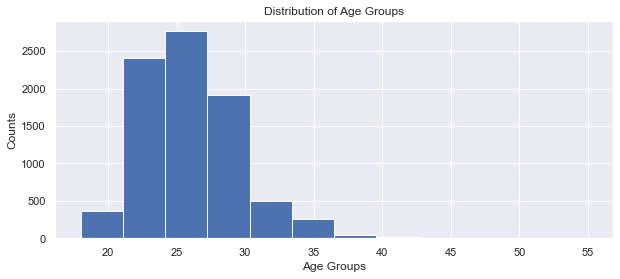

In [4]:
#Instantiate figure
sns.set()
fig, ax = plt.subplots(figsize = (10, 4))

#Plot ages
ax.hist(df['age_o'],
        bins = 12)

ax.set_title('Distribution of Age Groups')
ax.set_xlabel('Age Groups')
ax.set_ylabel('Counts');

#Include the mean age
mean_age = round(df['age_o'].mean())
print(f'Distribution of age groups with an average age of {mean_age}.')

In the graph above we can see that the average age is 26 with the vast majority of participants falling within the age range of 20-30.

Following this, we take a quick look at the age distribution, assuming it will be split relatively evenly due to the data being from speed dating events.

In [5]:
gender_split = df['gender'].value_counts(normalize = True)
print(f'''The percentage of men is: {round(gender_split[1], 4)*100}%
The percentage of women is {round(gender_split[0], 4)*100}%''')

The percentage of men is: 50.06%
The percentage of women is 49.94%


As expected, the gender split is almost exactly 50/50 between men and women.

Next, we take a look at how men and rated their goals for that night

In [6]:
#Converting the identifiers into their related strings
conditions = [df['goal'] == 1,
              df['goal'] == 2,
              df['goal'] == 3,
              df['goal'] == 4,
              df['goal'] == 5,
              df['goal'] == 6]
goal_string = ['Seemed Fun', 'Meet New People', 'Get a Date',
               'Serious Relationship', 'To Say I Went', 'Other']
df['goal'] = np.select(conditions, goal_string, default = 'No Answer')

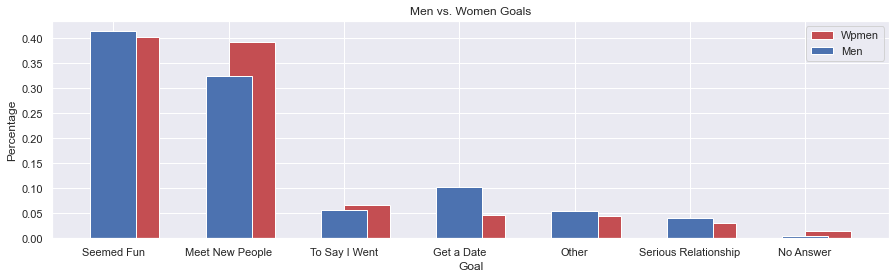

In [7]:
#Separate value counts between genders
women_goals = df[df['gender'] == 0]['goal'].value_counts(normalize = True)
men_goals = df[df['gender'] == 1]['goal'].value_counts(normalize = True)

#Zip value counts into tuples
women_goals_count = list(zip(women_goals.index, women_goals.values))
men_goals_count = list(zip(men_goals.index, men_goals.values))

#Instantiate figure
sns.set()
fig, ax = plt.subplots(figsize = (15, 4))
w = .4

#Plot points
ax.bar(
    x = [x for x,y in women_goals_count],
    height = [y for x,y in women_goals_count],
    align = 'edge',
    width = w,
    color = 'r'
)

ax.bar(
    x = [x for x,y in men_goals_count],
    height = [y for x,y in men_goals_count],
    width = w,
    color = 'b'
)

ax.legend(['Wpmen', 'Men'])
ax.set_xlabel('Goal')
ax.set_ylabel('Percentage')
ax.set_title('Men vs. Women Goals');

Looking at the graph above, we see that the distribution is generally the same between both sexes. 

With a large majority, attending the event because it seemed fun has an almost equal percentage. In addition, both sexes had their goal as meeting new people as the second highest rated goal although women did have a notably higher percentage in this area than men.

However, one notable difference is in those who stated their goal as "Get a Date." Seeing this imbalance, we take a closer look.

In [8]:
w_date, m_date = women_goals['Get a Date'], men_goals['Get a Date']
print(f'''The percent of men looking for a date is: {round(m_date, 4)*100}
The percent of women looking for a date is: {round(w_date, 4)*100}''')

The percent of men looking for a date is: 10.35
The percent of women looking for a date is: 4.71


When we look at the percentage of those looking for a date, we find that the percent of men is more than twice that when compared to women.

For a speed dating event, there is a surprisingly low percentage of individuals actually looking for a date. In addition, there is a large imbalance between the sexes.

As such, we take a look at how the sexes rate the following:
- What they stated they looked for in potential dates
- What they actually went for in potential dates

In [9]:
#Assign necessary columns to lists
self_columns = df.loc[:,'attr1_1':'shar1_1'].columns.tolist()
actual_columns = df.loc[:,'attr7_2':'shar7_2'].columns.tolist()

#Gather index for waves rated out of 10
ten_waves = df[df['wave'].isin(list(range(6,10)))].index.tolist()

#Bring surveys to the same scale
df.loc[ten_waves, self_columns] = df.loc[ten_waves, self_columns]*10

In [10]:
#Name columns
column_names = ['Attraction', 'Sincerity', 'Intelligence', 'Fun', 'Ambition', 'Shared Interests']

#Instantiate plot
fig = make_subplots(rows=1, cols=2, horizontal_spacing = 0.17,
                    specs=[[{'type': 'polar'}, {'type': 'polar'}]],
                    subplot_titles=('Stated Interests',  'Actual Interests'))

#Graph men's stated interests to left graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 1][self_columns].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Men\'s Stated Interest',
    fillcolor = 'blue',
    opacity = .5),
row = 1, col = 1)

#Graph women's stated interests to left graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 0][self_columns].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Women\'s Stated Interest',
    fillcolor = 'red',
    opacity = .5),
row = 1, col = 1)

#Graph men's actual interests to right graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 1][actual_columns].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Men\'s Actual Interest',
    fillcolor = 'blue',
    opacity = .5),
row = 1, col = 2)

#Graph wommen's actual interests to right graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 0][actual_columns].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Women\'s Actual Interest',
    fillcolor = 'red',
    opacity = .5),
row = 1, col = 2)

Within the stated interests, we can see that men rated attraction as the trait they most look for, with intelligence coming in second. Women rated the attributes relatively equally with intelligence, fun, and sincerity rating the highest overall.

However, when we look at the actual interests the ratings change quite a bit. On the right side we graph how men and women felt about their actual matches. Despite the way both men and women stated their interests, attraction came out as, by far, the most influential factor in their initial decision.

Seeing this, we decide to take a look into how participants viewed the importance of these attributes.

In [11]:
#Assign necessary columns to lists
most_men_women = df.loc[:,'attr4_1':'shar4_1'].columns.tolist()
opposite_sex = df.loc[:,'attr2_1':'shar2_1'].columns.tolist()

#Gather index for waves rated out of 10
ten_waves = df[df['wave'].isin(list(range(6,10)))].index.tolist()

#Bring surveys to the same scale
df.loc[ten_waves, most_men_women] = df.loc[ten_waves, most_men_women]*10
df.loc[ten_waves, opposite_sex] = df.loc[ten_waves, opposite_sex]*10

In [12]:
#Name columns
column_names = ['Attraction', 'Sincerity', 'Intelligence', 'Fun', 'Ambition', 'Shared Interests']

#Instantiate plot
fig = make_subplots(rows=1, cols=2, horizontal_spacing = 0.17,
                    specs=[[{'type': 'polar'}, {'type': 'polar'}]],
                    subplot_titles=('Believed Attribute Importance',  'Opposite Sex Attribute Importance'))

#Graph men's stated interests to left graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 1][most_men_women].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Men\'s Importance Rating',
    fillcolor = 'blue',
    opacity = .5),
row = 1, col = 1)

#Graph women's stated interests to left graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 0][most_men_women].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Women\'s Importance Rating',
    fillcolor = 'red',
    opacity = .5),
row = 1, col = 1)

#Graph men's actual interests to right graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 1][opposite_sex].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Men\'s Rating of Women',
    fillcolor = 'purple',
    opacity = .5),
row = 1, col = 2)

#Graph wommen's actual interests to right graph
fig.add_trace(go.Scatterpolar(
    r= df[df['gender'] == 0][opposite_sex].mean().tolist(),
    theta = column_names,
    fill = 'toself',
    name = 'Women\'s Rating of Men',
    fillcolor = 'orange',
    opacity = .5),
row = 1, col = 2 )

In both cases, attraction is viewed as highest. Both men and women believe that others find that the most important trait. Men's rating of women are more even overall, placing a near equal importance between intelligence, sincerity, and ambition, but attraction still comes out on top.

# Conclusion

While the stated attribute importance differs between sexes, the actual attribute importance lines up quite well, showing that physical attraction was the most important factor.

The believed attribute importance also lines up quite well with this. We find that despite what an individual states, physical attraction to each other is the most important factor in deciding whether or not individuals are interested in dating another.